<a href="https://colab.research.google.com/github/Eiver19/Estadistica-1-y-2/blob/main/Estadistica_I_Eiver_Castellanos.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Estadistíca descriptiva para variables cuantitativas

*   Gráficos para datos univaridos cuantitativos
*   Determinar las medidas descriptivas para datos univariados cuantitativos







In [18]:
from google.colab import files # Para cargar archivos en google colab
uploaded = files.upload()

Saving asriosgu_nac2020 (1).csv to asriosgu_nac2020 (1).csv


In [19]:
import pandas as pd
import io
io_csv = io.BytesIO(uploaded['asriosgu_nac2020 (1).csv'])
tabla = pd.read_csv(io_csv, sep = ",", index_col=0, encoding='latin-1')
tabla.head(3)

,COD_MUNIC,AREANAC,SIT_PARTO,OTRO_SIT,SEXO,PESO_NAC,TALLA_NAC,ANO,MES,ATEN_PAR,...,AREA_RES,N_HIJOSV,FECHA_NACM,N_EMB,SEG_SOCIAL,IDCLASADMI,EDAD_PADRE,NIV_EDUP,ULTCURPAD,PROFESION
COD_DPTO,,,,,,,,,,,,,,,,,,,,,
44,560,3,2,NaN,2,9,9,2020,11,5,...,3.0,1,NaN,1,2,2.0,20,99,99,5
44,560,3,2,NaN,1,9,9,2020,10,5,...,3.0,1,NaN,1,2,2.0,20,99,99,5
44,560,3,2,NaN,1,9,9,2020,10,5,...,3.0,1,NaN,1,2,2.0,20,99,99,5


In [20]:
DataFrame = tabla[["EDAD_PADRE", "EDAD_MADRE", "N_HIJOSV"]]
DataFrame.head(3)

,EDAD_PADRE,EDAD_MADRE,N_HIJOSV
COD_DPTO,,,
44,20,4,1
44,20,4,1
44,20,5,1


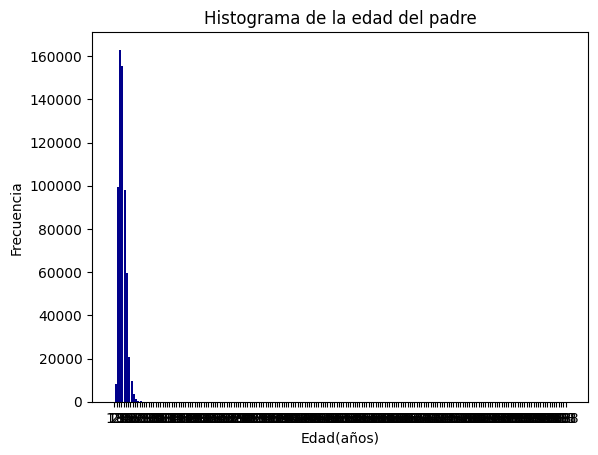

In [37]:
import matplotlib.pyplot as plot
Intervalos = range(min(DataFrame.EDAD_PADRE), max(DataFrame.EDAD_PADRE) + 1, 5)
plot.hist(DataFrame.EDAD_PADRE, bins=Intervalos, color='Darkblue', rwidth=0.85)
plot.title('Histograma de la edad del padre')
plot.xlabel('Edad(años)')
plot.ylabel('Frecuencia')
plot.xticks(Intervalos)
plot.show()

In [23]:
df1 = DataFrame[(DataFrame.EDAD_PADRE < 120) & (DataFrame.EDAD_MADRE != 99) & (DataFrame.N_HIJOSV != 99)]
df1.head(5)


,EDAD_PADRE,EDAD_MADRE,N_HIJOSV
COD_DPTO,,,
44,20,4,1
44,20,4,1
44,20,5,1
44,20,5,1
44,20,3,1


<ipython-input-40-f436a80b268f>:13: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.
  plt.plot(x, p, 'k', linewidth=2, label='Distribución Normal', color = "darkblue")


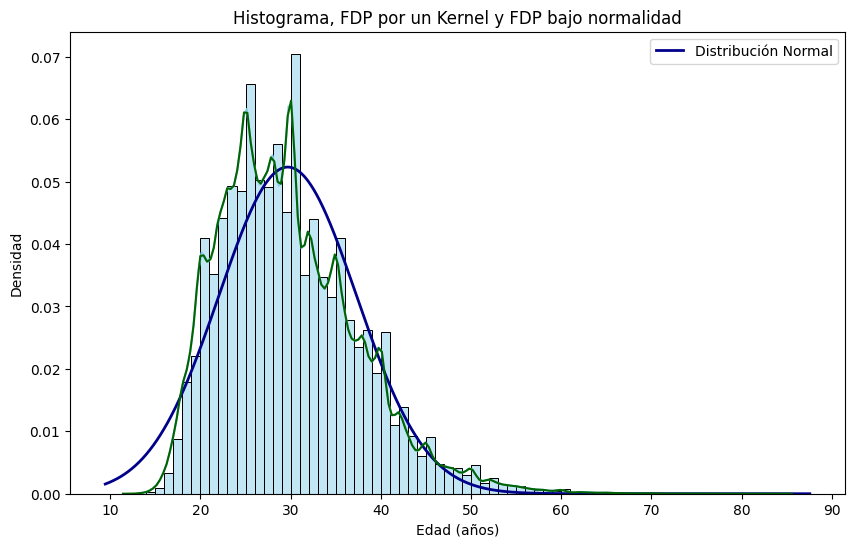

In [40]:
import seaborn as sns
import numpy as np
from scipy.stats import norm
import matplotlib.pyplot as plot
intervalos1 = range(min(df1.EDAD_PADRE), max(df1.EDAD_PADRE) + 1)
plot.figure(figsize=(10, 6))
sns.histplot(x = df1.EDAD_PADRE, bins = intervalos1, kde = True, stat = "density", color = "skyblue", edgecolor='black') # kde = True es la gráfica de la función de densidad de probabilidad estimada por un método Kernell

xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 1000)
p = norm.pdf(x, np.mean(df1.EDAD_PADRE), np.std(df1.EDAD_PADRE))

plt.plot(x, p, 'k', linewidth=2, label='Distribución Normal', color = "darkblue")
sns.kdeplot(x=df1.EDAD_PADRE, color = "darkgreen")

plt.title('Histograma, FDP por un Kernel y FDP bajo normalidad')
plt.xlabel('Edad (años)')
plt.ylabel('Densidad')
plt.legend()

# Mostrar el gráfico
plt.show()






Sea $X:=$ Edad del padre de un recién nacido en Colombia

Descriptivamente como la función de densidad de probabilidad de los datos estimada por un método Kernel (línea cyan) no coincide con la función de densidad de probabilidad asumiendo el supuesto de normalidad (línea azul), $X\sim \text (Normal) (\text Media=\bar(x), \text Varianza = S^2_x)$ Entonces no asuminos normalidad de acuerdo con las graficas.

In [42]:
from scipy.stats import shapiro
shapiro(df1.EDAD_PADRE)

/usr/local/lib/python3.10/dist-packages/scipy/stats/_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


ShapiroResult(statistic=0.9588148593902588, pvalue=0.0)



*  Si **el valor P** en una prueba de hipótesis es menor que 0.05 se rechaza la hipótesis nula con una confianza del 95%

*  Si **el valor P** en una prueba de hipótesis es mayor que 0.05 no se rechaza la hipótesis nula con una confianza del 95%






In [50]:
df1.EDAD_PADRE.count()
len(df1.EDAD_PADRE)

619932

In [61]:
idx = np.random.randint(len(df1.EDAD_PADRE), size = 100)
shapiro(df1.EDAD_PADRE.index[idx])

ShapiroResult(statistic=0.859089195728302, pvalue=2.6082851434239274e-08)

Como el valor p (igual =$2.6082851434239274e-08 $) es menor que 0.05, entonces se rechaza que la variable aleatoria de la edad de un padre de un recién nacido en Colombia presenta distribución normal.

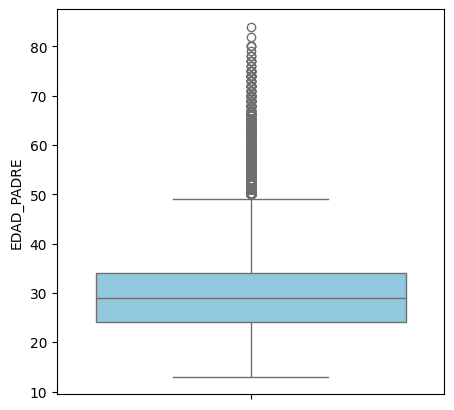

In [72]:
plt.figure(figsize=(5, 5))
sns.boxplot(df1.EDAD_PADRE, color='skyblue', saturation=0.75)
plt.show()


Se considera que la edad de un padre de un recién nacido en Colombia es atípica si es mayor que 50 años. El primer cuartil es aproximadamente 25 años, la media aritmética es aproximadamente 29 años y el tercer cuartil es aproximadamente 35 años.
$\text {Rango intercuartílico = tercer cuartil - primer cuatil} = 35 - 25 = 10$

In [74]:
import plotly.express as px
plt.figure(figsize=(5, 5))
fig = px.strip(df1.EDAD_PADRE, orientation = 'h')
fig.show()

<Figure size 500x500 with 0 Axes>


De acuerdo con el diagrama de puntos se observa una alta variabilidad de la edad de un padre de un recién Nacido en Colombia.

In [76]:
import numpy as np
from scipy.stats import norm
from scipy.stats import skew, kurtosis
print(f"Media: {np.mean(df1.EDAD_PADRE)}")
print(f"Varianza {np.var(df1.EDAD_PADRE)} y la desviación estándar es de {np.std(df1.EDAD_PADRE)}")
print(f"Asimetría: {skew(df1.EDAD_PADRE)}")
print(f"Curtosis: {kurtosis(df1.EDAD_PADRE)}")

Media: 29.677262990134402
Varianza 58.1377076723756 y la desviación estándar es de 7.624808697428126
Asimetría: 0.8353028835229743
Curtosis: 0.9739261066839422




*   Aproximadamente el promedio de la edad de un padre de un recién nacido en Colombia es de 29.7 años.
*   Aproximadamente la distancia entre los valores de la edad edad un padre de un recién nacido en Colombia y la media es de 7.62 años.
*   La distribución de la edad de un padre de un recién nacido en Colombia es asimétrica positiva, es decir, la media es mayor que la moda de la variable aleatoria.
*   La distribución es platicúrtica, es decir, hay una baja concentración de las edades de un padre de un recién nacido en Colombia con respecto a la media.







**Diagrama de dispersión y la recta de regresión para datos bivariados**

Una variable depende de la otra, cuando la ejecución de esta se ve afectada por la variable independiente. Ejemplo: El precio de una vivienda depende del número de habitaciones, ya que entre más habitaciones se tiene mayor precio.

Una variable está correlacionada con otra, cuando guardan cierta relación, pero no es posible hablar de dependencia. Ejemplo: Consumo de arroz y de carne, ya que se ha visto que al comerse más arroz se come más carne, pero no hay una dependencia entre estas dos variables

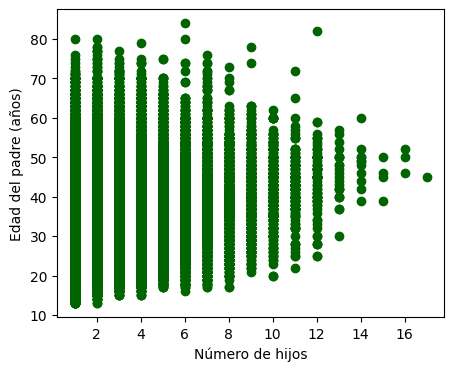

In [77]:
plt.figure(figsize=(5, 4))
plt.scatter(df1["N_HIJOSV"], df1["EDAD_PADRE"], color = "darkgreen", marker = "o")
plt.xlabel('Número de hijos')
plt.ylabel('Edad del padre (años)')
plt.show()

e observa en el diagrama de dispersión una nube de puntos sin un patrón particular, esto quiere decir que las variables son independientes o no están correlacionadas. Para nuestro ejemplo quiere decir que el número de hijos y la edad de un padre en Colombia no están correlacionadas (padre joven con muchos hijos o un padre mayor con pocos hijos)

In [79]:
from sklearn.linear_model import LinearRegression
from scipy.stats import spearmanr, kendalltau
modelo = LinearRegression()
# df1["N_HIJOSV"] es igual a escribir df1.N_HIJOSV
modelo.fit(np.array(df1.N_HIJOSV).reshape(-1, 1), np.array(df1["EDAD_PADRE"]).reshape(-1, 1))
predi_lineal = modelo.predict(np.array(df1.N_HIJOSV).reshape(-1, 1))
predi_lineal

array([[27.63034824],
       [27.63034824],
       [27.63034824],
       ...,
       [29.82688099],
       [27.63034824],
       [27.63034824]])

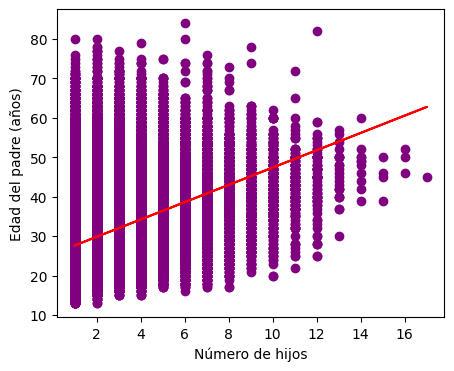

In [80]:
plt.figure(figsize=(5, 4))
plt.scatter(df1["N_HIJOSV"], df1["EDAD_PADRE"], color = "purple", marker = "o")
plt.plot(df1["N_HIJOSV"], predi_lineal, linestyle='-', color = "red")
plt.xlabel('Número de hijos')
plt.ylabel('Edad del padre (años)')
plt.show()

De acuerdo con la recta de regresión se determina una correlación positiva, es decir que entre más hijos tiene un hombre en Colombia, más años tiene esta persona.

*La variable Y depende positivamente de la variable X, es decir, entre mayor valor de X se tenga, mayor será el valor de Y*

In [82]:
from scipy.stats import spearmanr, kendalltau
coef_pearson = np.corrcoef(df1["N_HIJOSV"], df1["EDAD_PADRE"])[0, 1]
coef_spearman, _ = spearmanr(df1["N_HIJOSV"], df1["EDAD_PADRE"])
coef_kendall, _ = kendalltau(df1["N_HIJOSV"], df1["EDAD_PADRE"])
print(f"Los coeficientes de correlación de Pearson, Spearman y Kendall son respectivamente {coef_pearson}, {coef_spearman} y {coef_kendall}.")


Los coeficientes de correlación de Pearson, Spearman y Kendall son respectivamente 0.339909584425517, 0.3645543846935495 y 0.2875746849739477.


AQUI ES

# **Estadística descriptiva para variables cualitativas**



* Gráficos para datos de una variable cualitativa
* Proporciones asociadas a los valores de una variable cualitativa




In [83]:
io_csv = io.BytesIO(uploaded['asriosgu_nac2020 (1).csv'])
tabla = pd.read_csv(io_csv, sep = ",", index_col=0, encoding='latin-1')
tabla.head(3)

,COD_MUNIC,AREANAC,SIT_PARTO,OTRO_SIT,SEXO,PESO_NAC,TALLA_NAC,ANO,MES,ATEN_PAR,...,AREA_RES,N_HIJOSV,FECHA_NACM,N_EMB,SEG_SOCIAL,IDCLASADMI,EDAD_PADRE,NIV_EDUP,ULTCURPAD,PROFESION
COD_DPTO,,,,,,,,,,,,,,,,,,,,,
44,560,3,2,NaN,2,9,9,2020,11,5,...,3.0,1,NaN,1,2,2.0,20,99,99,5
44,560,3,2,NaN,1,9,9,2020,10,5,...,3.0,1,NaN,1,2,2.0,20,99,99,5
44,560,3,2,NaN,1,9,9,2020,10,5,...,3.0,1,NaN,1,2,2.0,20,99,99,5


In [84]:
tabla1 = tabla[["EDAD_MADRE", "IDHEMOCLAS", "IDFACTORRH"]]
tabla1.head(4)

,EDAD_MADRE,IDHEMOCLAS,IDFACTORRH
COD_DPTO,,,
44,4,9,9
44,4,9,9
44,5,9,9
44,5,9,9


In [85]:
df2 = tabla1[(tabla1.EDAD_MADRE < 99) & (tabla1["IDHEMOCLAS"] != 9) & (tabla1.IDFACTORRH != 9)]
df2.head(4)

,EDAD_MADRE,IDHEMOCLAS,IDFACTORRH
COD_DPTO,,,
20,4,3,1
20,6,3,1
85,2,1,1
47,3,3,1


In [86]:
df2.EDAD_MADRE.head(2)
df2.EDAD_MADRE = df2.EDAD_MADRE.astype(str)
df2.EDAD_MADRE.head(2)


<ipython-input-86-2f7fccefb7c0>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



COD_DPTO
20    4
20    6
Name: EDAD_MADRE, dtype: object

In [87]:
df2.loc[(df2.EDAD_MADRE == "1"), "EDAD_MADRE"], df2.loc[(df2.EDAD_MADRE == "2"), "EDAD_MADRE"], df2.loc[(df2.EDAD_MADRE == "3"), "EDAD_MADRE"], df2.loc[(df2.EDAD_MADRE == "4"), 'EDAD_MADRE'] = "10-14", "15-19", "20-24", "25-29"
df2.loc[(df2.EDAD_MADRE == "5"), 'EDAD_MADRE'], df2.loc[(df2.EDAD_MADRE == "6"), 'EDAD_MADRE'], df2.loc[(df2.EDAD_MADRE == "7"), 'EDAD_MADRE'], df2.loc[(df2.EDAD_MADRE == "8"), 'EDAD_MADRE'] = "30-34", "35-39", "40-44", "45-49"
df2.loc[(df2.EDAD_MADRE == "9"), 'EDAD_MADRE'], df2.loc[(df2.EDAD_MADRE == "99"), 'EDAD_MADRE'] = "50-55", "NA"
df2.head(5)

,EDAD_MADRE,IDHEMOCLAS,IDFACTORRH
COD_DPTO,,,
20,25-29,3,1
20,35-39,3,1
85,15-19,1,1
47,20-24,3,1
19,20-24,3,1


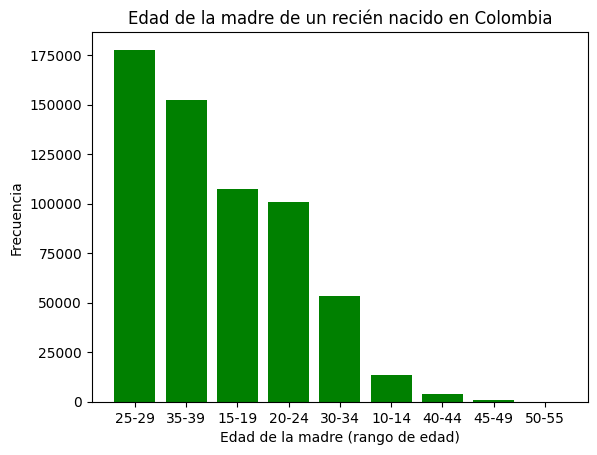

In [88]:
x_values = df2.EDAD_MADRE.unique()
y_values = df2.EDAD_MADRE.value_counts().tolist()
plt.bar(x_values, y_values, color = "green")
plt.title('Edad de la madre de un recién nacido en Colombia')
ax = plt.subplot()  # Axis
ax.set_xlabel('Edad de la madre (rango de edad)')
ax.set_ylabel('Frecuencia')
plt.show()

El valor de 25 a 29 años es el rango de edad donde se tienen alrededor de 175000 madres de recién nacidos en Colombia, y es donde se tienen más madres. En rango de edad de 30 a 34 años se tienen aproximadamente 50000 madres de recién nacidos en Colombia. Los rangos de edades de 10 a 14 años, de 40 a 44 años, de 45 a 49 años y de 50 a 54 años tienen menos de 25000 madres de recién nacidos en Colombia.

In [89]:
sizes = np.array(y_values)
sizes


array([177762, 152262, 107407, 100703,  53505,  13647,   4120,    902,
          106])

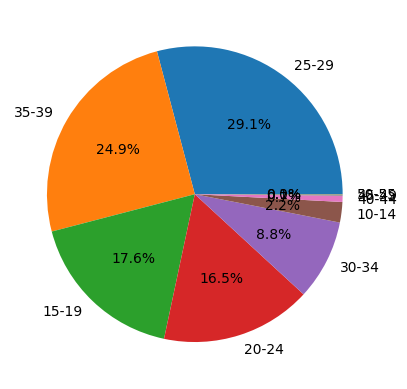

In [90]:
plt.pie(y_values, labels = x_values, autopct='%1.1f%%')
plt.show()

In [91]:

len(df2.EDAD_MADRE)

610414

In [92]:
porcentaje = [(x/len(df2.EDAD_MADRE)*100) for x in y_values]
print(x_values)
print(porcentaje)

['25-29' '35-39' '15-19' '20-24' '30-34' '10-14' '40-44' '45-49' '50-55']
[29.121547015632014, 24.944054363104385, 17.595762875687647, 16.49749186617607, 8.76536252445062, 2.235695773688022, 0.6749517540554443, 0.14776856363058513, 0.01736526357521289]


Aproximadamente el 29.12% de las madres de recién nacidos en Colombia tiene entre 25 y 29 años, el 24.94% entre 35 y 39 años, el 17.6% entre 15 y 19 años, el 16.5% entre 20 y 24 años, el 8.77% entre 30 y 34 años, el 2.24% entre 10 y 14 años, el 0.67% entre 40 y 44 años, el 0.15% entre 45 y 49 años, y el 0.02% entre 50 y 55 años

# **Tablas de contingencia**

* Representación gráfica de una tabla de contingencia
* Proporciones asociadas a una tabla de contingencia



In [93]:
df2.loc[(df2.IDHEMOCLAS == 1), "IDHEMOCLAS"], df2.loc[(df2.IDHEMOCLAS == 2), "IDHEMOCLAS"], df2.loc[(df2.IDHEMOCLAS == 3), "IDHEMOCLAS"], df2.loc[(df2.IDHEMOCLAS == 4), "IDHEMOCLAS"] = "A", "B", "O", "AB"
df2.loc[(df2.IDFACTORRH == 1), "IDFACTORRH"], df2.loc[(df2.IDFACTORRH == 2), "IDFACTORRH"] = "Positivo", "Negativo"
df2.IDHEMOCLAS, df2.IDFACTORRH = df2.IDHEMOCLAS.astype(str), df2.IDFACTORRH.astype(str)
df2.head(3)


<ipython-input-93-0fe756aa7aa9>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,EDAD_MADRE,IDHEMOCLAS,IDFACTORRH
COD_DPTO,,,
20,25-29,O,Positivo
20,35-39,O,Positivo
85,15-19,A,Positivo


In [94]:
tabla_cont = pd.crosstab(df2.IDHEMOCLAS, df2["IDFACTORRH"])
tabla_cont

IDFACTORRH,Negativo,Positivo
IDHEMOCLAS,,
A,7571,145747
AB,590,10477
B,2465,53545
O,17168,372851


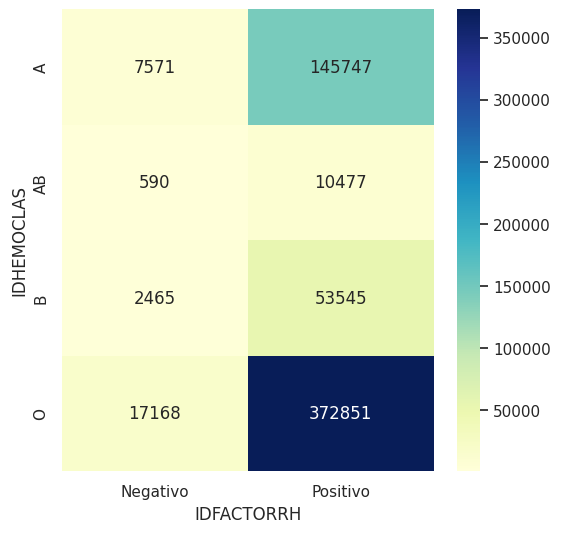

In [95]:
sns.set(style="whitegrid")
plt.figure(figsize=(6, 6))
heatmap = sns.heatmap(tabla_cont,  annot=True, fmt='d', cmap='YlGnBu', cbar=True)
plt.show()

In [98]:
import scipy.stats as stats
res = stats.chi2_contingency(tabla_cont)
chi, valor_p, _, _ = res
print(f"El valor de la estadística Chi cuadrado es {chi} y el valor p es d {valor_p}")

El valor de la estadística Chi cuadrado es 91.22282137965206 y el valor p es d 1.196444966259606e-19




* Si valor p < 0.05 se rechaza la hipótesis nula
* Si valor p > 0.05 no se rechaza la hipótesis nula
Como el valor P $\text =1.196444966259606e-19 < 0.005$ se rechaza la hipótesis nula, es decir, no se rechaza con una confianza del 95% que la hemoclasificación y el factor RH estén asociadas para los individuos recién nacidos en Colombia.

In [99]:
import math
coeficiente_contingencia = math.sqrt(chi/(chi + len(df2.IDFACTORRH)))
coeficiente_phi = math.sqrt(chi/len(df2.IDFACTORRH))
coeficiente_v_cramer = math.sqrt(chi/(len(df2.IDFACTORRH)*min(4-1, 2-1)))
print(f"Los coeficientes de contingencia, Phi y V de Cramer están respectivamente dados por {coeficiente_contingencia}, {coeficiente_phi} y {coeficiente_v_cramer}")


Los coeficientes de contingencia, Phi y V de Cramer están respectivamente dados por 0.012223823155647762, 0.012224736511156013 y 0.012224736511156013


De acuerdo con el artículo Landis, J. R., & Koch, G. G. (1977). The measurement of observer agreement for categorical data. biometrics, 159-174, el cual se puede consultar en el siguiente link, se tiene que la hemoclasificación y el factor RH están insignificantemente asociados